# Import Liabraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

In [3]:
# Librosa
import librosa
import librosa.display
import IPython.display as ipd

In [4]:
import os
general_path = '../input/gtzan'
print(list(os.listdir(f'{general_path}/genres_original/')))

['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


# e.g.

In [5]:
# Importing 1 file
y, sr = librosa.load(f'{general_path}/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [6]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


In [7]:

genres = ['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


# Import all audio files for each genre

In [8]:
# Load all audio files for each genre
audio_data = {}
sampling_rates = {}

# Iterate through genres and load the first audio file of each genre
for genre in genres:
    file_path = f'{general_path}/genres_original/{genre}/{genre}.00000.wav'  # Example file name pattern
    audio, sr = librosa.load(file_path, sr=None)  # Load with original sampling rate
    audio_data[genre] = audio
    sampling_rates[genre] = sr

print("Audio files loaded for all genres.")

Audio files loaded for all genres.


# Visualization

# Raw Audio Waveform(Sound Waves)-

Helps in understanding the overall structure of audio (amplitude vs. time).
Gives insight into the dynamics of a song (e.g., quiet vs. loud segments, transitions).

How to Use:
Plot the waveform for audio files from different genres to observe:
Differences in energy levels.
Time-domain patterns (e.g., reggae might have softer dynamics compared to rock).

Key Observations:
Identify genres with sharp attacks (e.g., drums in rock).
Smooth waveforms may indicate calmer genres (e.g., classical, jazz).

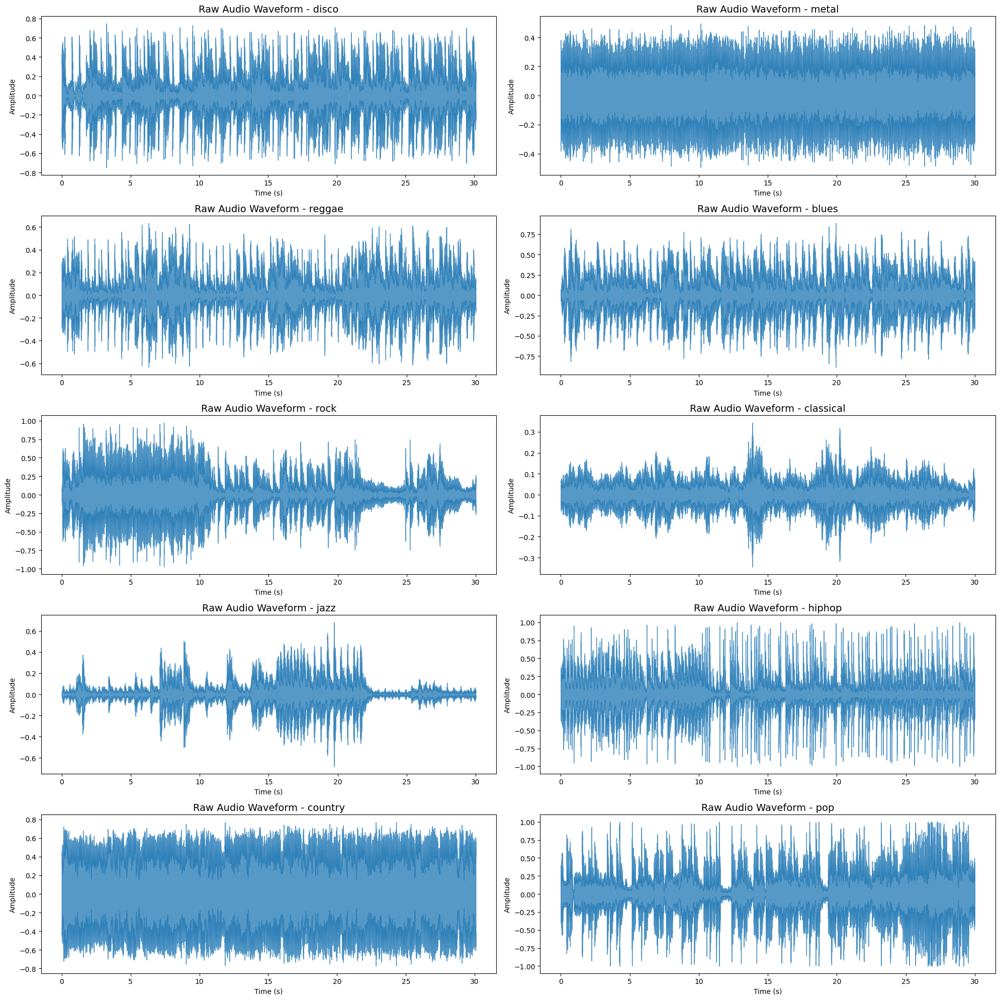

In [9]:
# Visualize raw audio waveforms
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)  # Create a grid of 5 rows, 2 columns
    librosa.display.waveshow(audio_data[genre], sr=sampling_rates[genre], alpha=0.75)
    plt.title(f"Raw Audio Waveform - {genre}", fontsize=14)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

# Spectrogram

Displays the frequency content of audio over time.
Offers a visual signature of different genres (e.g., high frequencies dominate electronic music, while lower frequencies dominate blues).
                                               
How to Use:
Generate a log-mel spectrogram or short-time Fourier transform (STFT) spectrogram.
Compare spectrograms for different genres to highlight frequency distribution patterns.
                                               
Key Observations:
Genres like classical may have broad frequency coverage.
Rock or metal may show dense high-energy bands across time.

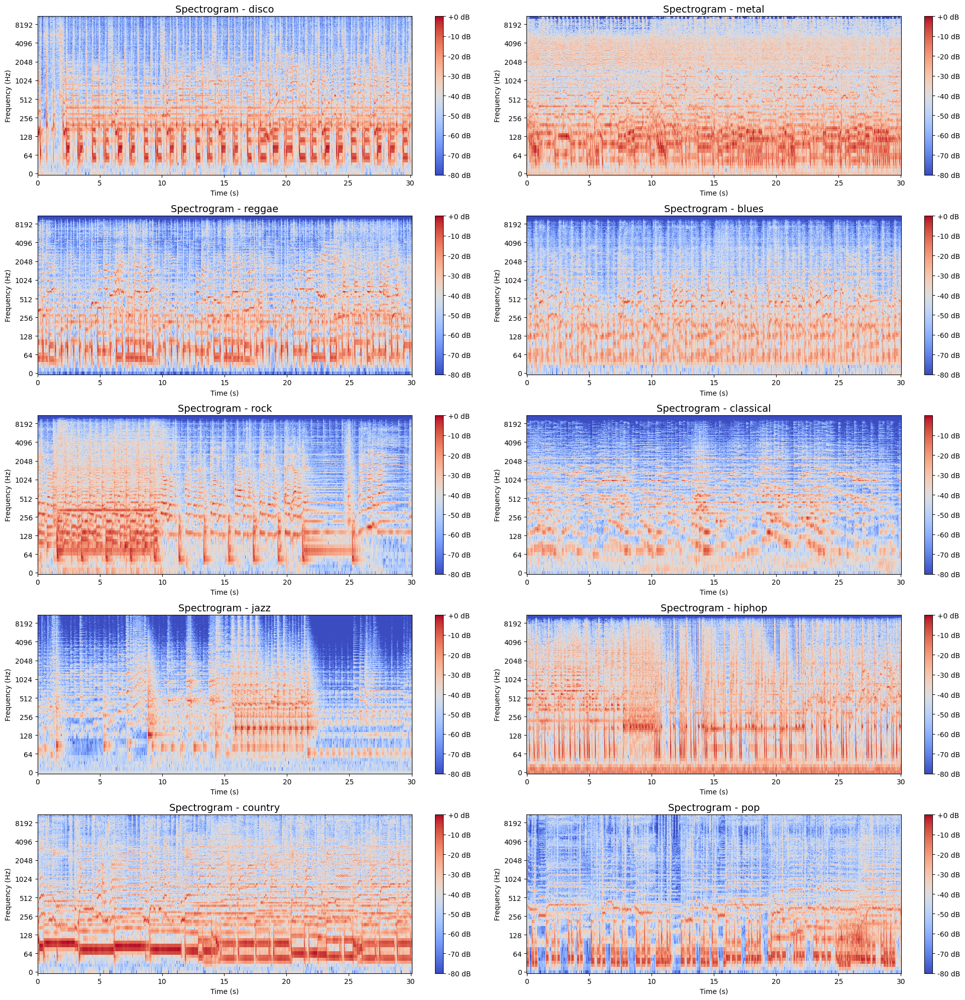

In [10]:
# Visualize spectrograms
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    # Compute the Short-Time Fourier Transform (STFT) and plot spectrogram
    D = librosa.amplitude_to_db(np.abs(librosa.stft(audio_data[genre])), ref=np.max)
    librosa.display.specshow(D, sr=sampling_rates[genre], x_axis='time', y_axis='log', cmap='coolwarm')
    plt.title(f"Spectrogram - {genre}", fontsize=14)
    plt.colorbar(format="%+2.0f dB")
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()

# Mel-Spectrogram

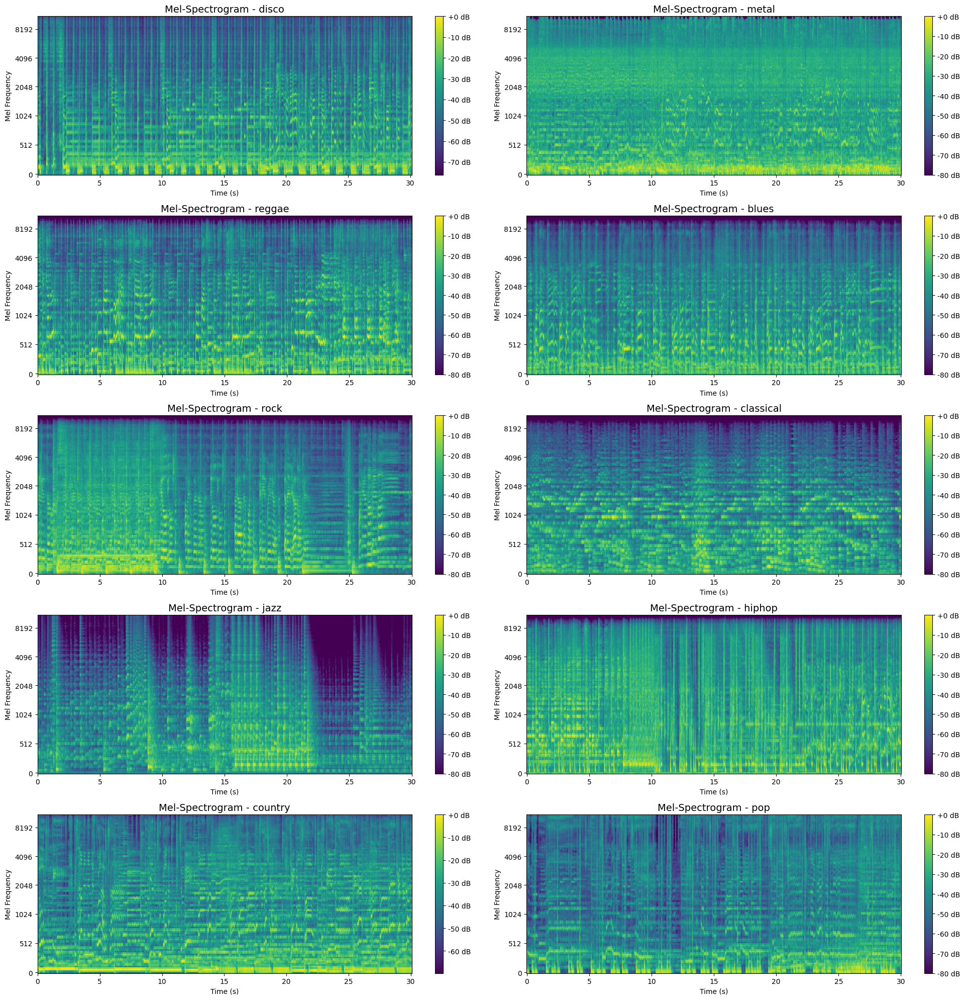

In [11]:
# Visualize Mel-Spectrograms for all classes
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    mel_spect = librosa.feature.melspectrogram(y=audio_data[genre], sr=sampling_rates[genre], n_mels=128)
    mel_spect_db = librosa.power_to_db(mel_spect, ref=np.max)
    librosa.display.specshow(mel_spect_db, sr=sampling_rates[genre], x_axis='time', y_axis='mel', cmap='viridis')
    plt.title(f"Mel-Spectrogram - {genre}", fontsize=14)
    plt.colorbar(format="%+2.0f dB")
    plt.xlabel("Time (s)")
    plt.ylabel("Mel Frequency")
plt.tight_layout()
plt.show()

# Mel-Frequency Cepstral Coefficients (MFCCs)

MFCCs capture the timbre (tonal quality) of audio, which is one of the most distinctive characteristics of genres.
    
How to Use:
Visualize MFCCs as a heatmap for individual songs.
Compare heatmaps across genres for variations in tonal patterns.
                       
Key Observations:
Rock might show sharper MFCC patterns due to higher percussive content.
Jazz or classical may show smoother, more intricate MFCC variations.

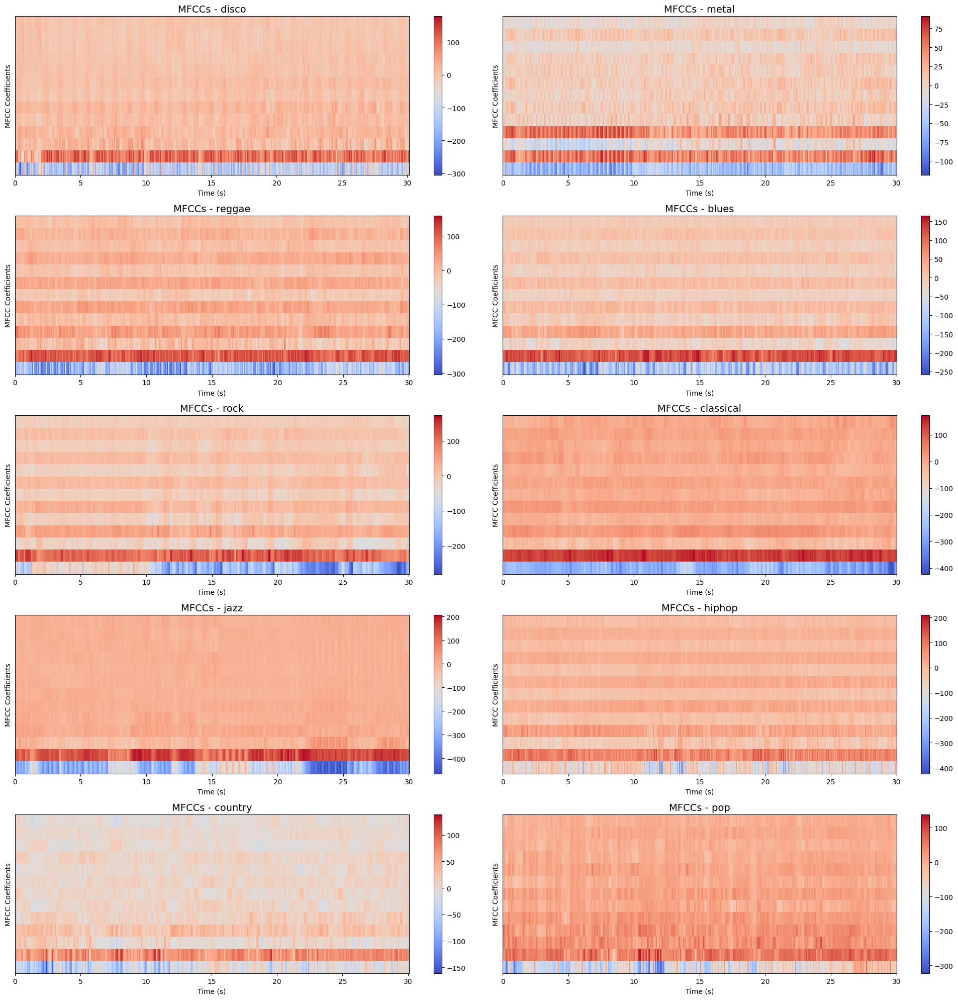

In [12]:
# Visualize MFCCs for all classes
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    mfccs = librosa.feature.mfcc(y=audio_data[genre], sr=sampling_rates[genre], n_mfcc=13)
    librosa.display.specshow(mfccs, sr=sampling_rates[genre], x_axis='time', cmap='coolwarm')
    plt.title(f"MFCCs - {genre}", fontsize=14)
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("MFCC Coefficients")
plt.tight_layout()
plt.show()

# Chroma Features

Chroma features map the audio spectrum into 12 distinct pitch classes (like keys on a piano).
They are great for analyzing harmony and melody in music.
                                                                       
How to Use:
Visualize chroma features as a heatmap to observe how pitches are distributed over time.
                                                                       
Key Observations:
Genres like classical or jazz might show more harmonic diversity.
Pop or rock might have repetitive patterns due to chord progressions.


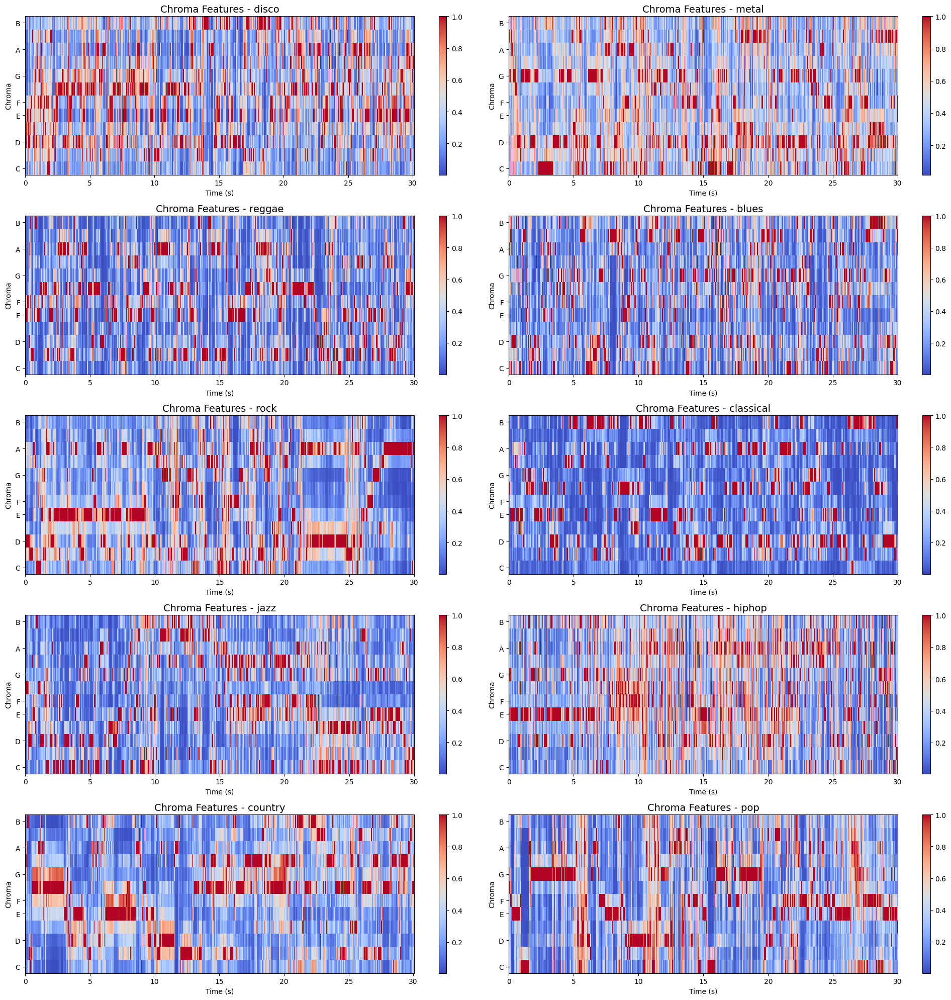

In [13]:
# Visualize Chroma Features for all classes
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    chroma = librosa.feature.chroma_stft(y=audio_data[genre], sr=sampling_rates[genre])
    librosa.display.specshow(chroma, sr=sampling_rates[genre], x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.title(f"Chroma Features - {genre}", fontsize=14)
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("Chroma")
plt.tight_layout()
plt.show()

# Spectral Features

Spectral features like spectral centroid, bandwidth, and rolloff give insights into how “bright” or “dark” a genre sounds.
    
How to Use:

Plot these features across genres using scatter plots or boxplots.
    
Key Observations:

Electronic or pop may have a higher spectral centroid due to dominance of high frequencies.

Jazz or blues may have lower centroid values with more focus on lower frequencies.


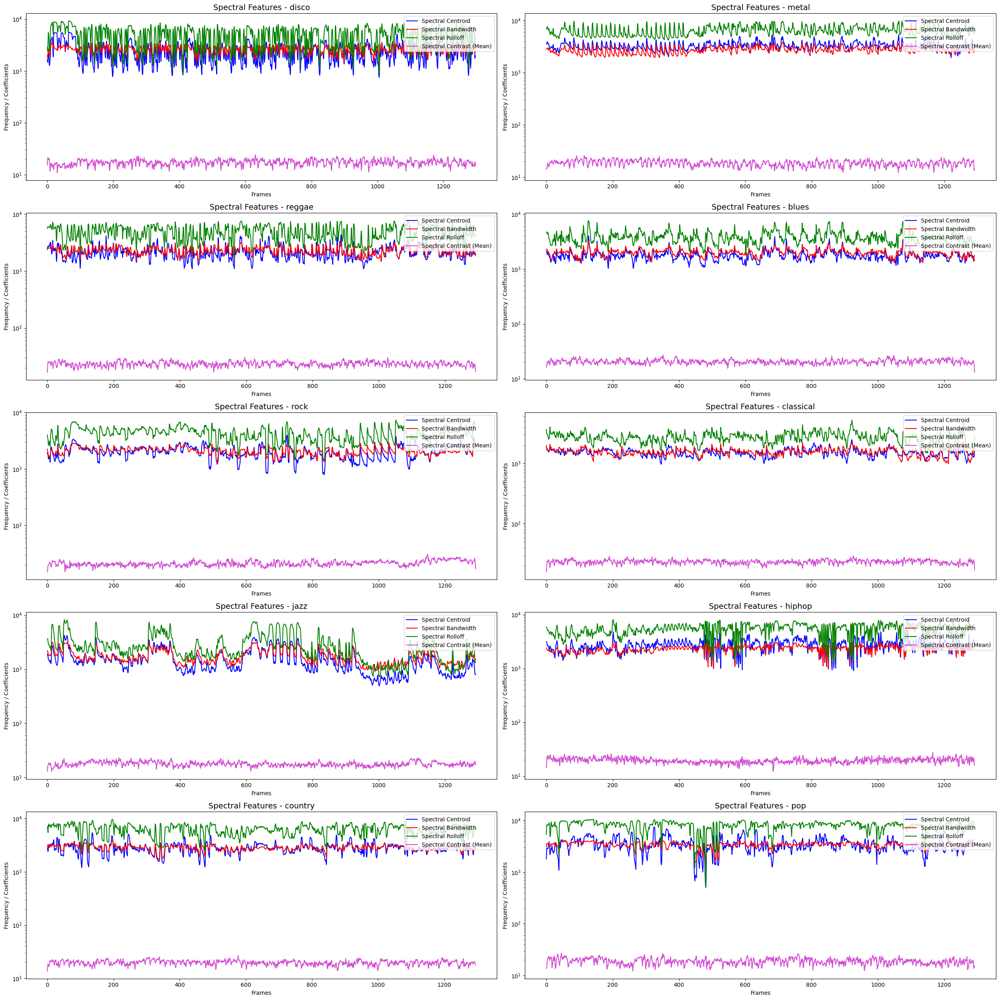

In [14]:
# Visualize Spectral Features for all classes
plt.figure(figsize=(25, 25))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    
    # Spectral Centroid
    spectral_centroid = librosa.feature.spectral_centroid(y=audio_data[genre], sr=sampling_rates[genre])
    plt.semilogy(spectral_centroid.T, label='Spectral Centroid', color='b')
    
    # Spectral Bandwidth
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio_data[genre], sr=sampling_rates[genre])
    plt.semilogy(spectral_bandwidth.T, label='Spectral Bandwidth', color='r')
    
    # Spectral Rolloff
    spectral_rolloff = librosa.feature.spectral_rolloff(y=audio_data[genre], sr=sampling_rates[genre], roll_percent=0.85)
    plt.semilogy(spectral_rolloff.T, label='Spectral Rolloff', color='g')
    
    # Spectral Contrast - Plot only the mean across frequency bands
    spectral_contrast = librosa.feature.spectral_contrast(y=audio_data[genre], sr=sampling_rates[genre])
    plt.plot(spectral_contrast.mean(axis=0), label='Spectral Contrast (Mean)', color='m', alpha=0.7)
    
    plt.title(f"Spectral Features - {genre}", fontsize=14)
    plt.legend(loc='upper right')
    plt.xlabel("Frames")
    plt.ylabel("Frequency / Coefficients")
plt.tight_layout()
plt.show()


# Zero Crossing Rate (ZCR) 

is an essential feature in audio analysis, representing the rate at which a signal changes its sign.

It is particularly useful for distinguishing between tonal and non-tonal signals.

# Tonal Signals:

These signals exhibit a clear and periodic frequency structure.

Examples: Notes in classical music, sine waves, vocals.

Characteristics: Lower Zero Crossing Rate (ZCR), smoother waveform.

# Non-Tonal Signals:

These are noise-like or percussive sounds with a random frequency distribution.

Examples: Drum beats, noisy instruments, metal music.

Characteristics: Higher Zero Crossing Rate (ZCR), jagged waveform

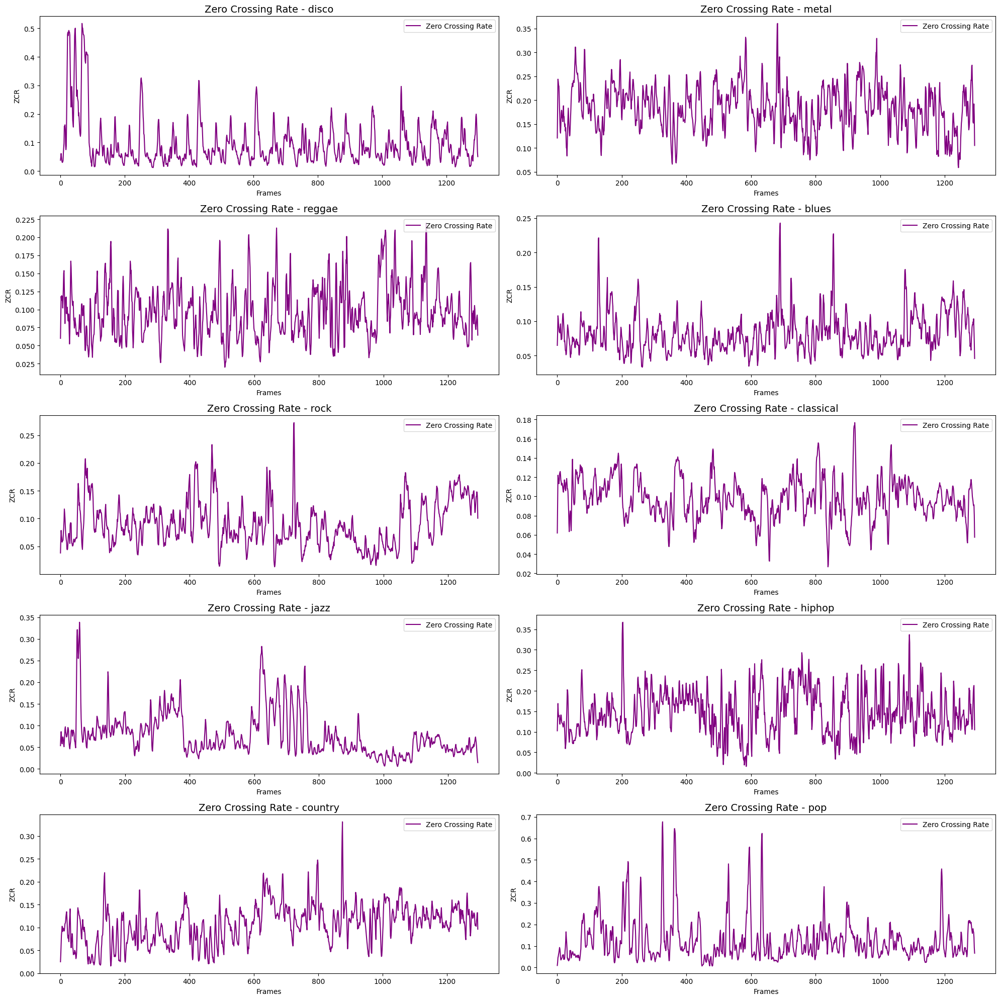

In [15]:
# Visualize Zero Crossing Rate (ZCR) for all classes
plt.figure(figsize=(20, 20))
for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    
    # Compute Zero Crossing Rate
    zcr = librosa.feature.zero_crossing_rate(y=audio_data[genre])
    
    # Plot ZCR
    plt.plot(zcr[0], label="Zero Crossing Rate", color='purple')
    plt.title(f"Zero Crossing Rate - {genre}", fontsize=14)
    plt.xlabel("Frames")
    plt.ylabel("ZCR")
    plt.legend(loc='upper right')
    
plt.tight_layout()
plt.show()

A blue waveform representing the signal.

Red dots indicating zero crossing points.
    
The total number of zero crossings in the plot title.


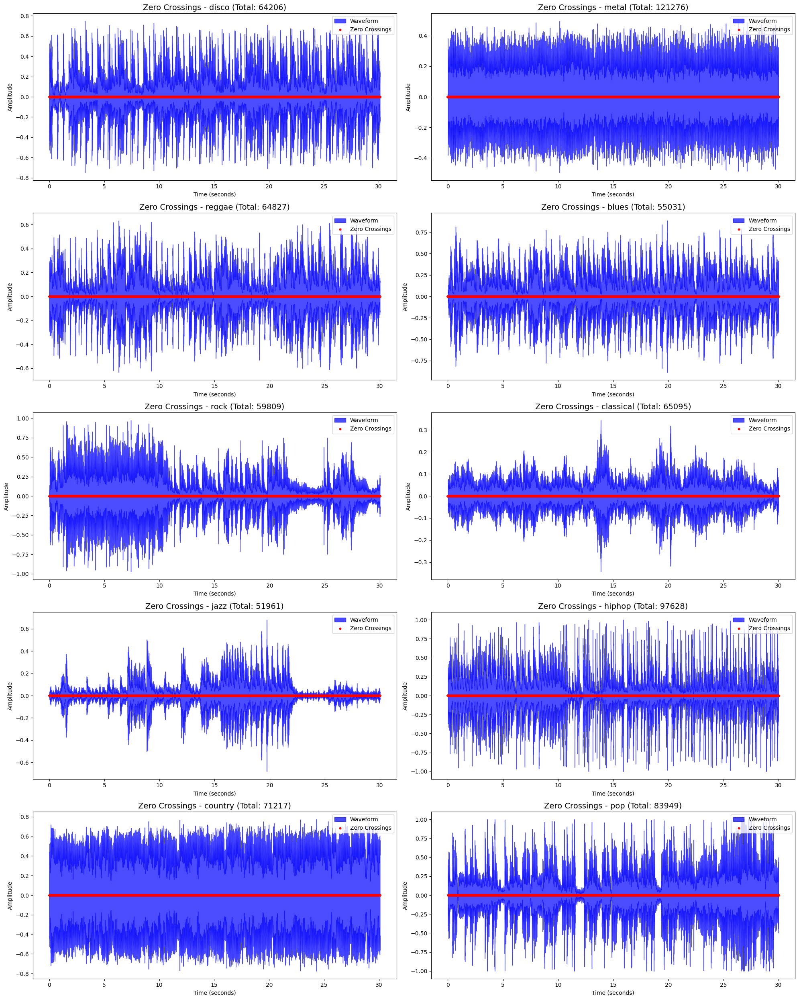

Total Zero Crossings for Each Genre:
disco: 64206
metal: 121276
reggae: 64827
blues: 55031
rock: 59809
classical: 65095
jazz: 51961
hiphop: 97628
country: 71217
pop: 83949


In [16]:
# Visualizing Total Zero Crossings for All Classes
plt.figure(figsize=(20, 25))
total_zero_crossings = {}

for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    
    # Extract audio and sampling rate for the genre
    audio = audio_data[genre]
    sr = sampling_rates[genre]
    
    # Plot the waveform
    librosa.display.waveshow(audio, sr=sr, alpha=0.7, color='blue', label='Waveform')
    
    # Highlight zero crossings
    zero_crossings = librosa.zero_crossings(audio, pad=False)
    zero_crossing_points = np.where(zero_crossings)[0]  # Indices where zero crossings occur
    
    # Plot zero crossing points
    plt.scatter(
        zero_crossing_points / sr,  # Convert indices to time
        np.zeros_like(zero_crossing_points),  # Zero amplitude for crossings
        color='red',
        label='Zero Crossings',
        s=10
    )
    
    # Store total zero crossings for the genre
    total_zero_crossings[genre] = sum(zero_crossings)
    
    plt.title(f"Zero Crossings - {genre} (Total: {sum(zero_crossings)})", fontsize=14)
    plt.xlabel("Time (seconds)")
    plt.ylabel("Amplitude")
    plt.legend()

plt.tight_layout()
plt.show()

# Print total zero crossings for all classes
print("Total Zero Crossings for Each Genre:")
for genre, count in total_zero_crossings.items():
    print(f"{genre}: {count}")


#  Harmonics

#Harmonics-to-Noise Ratio (HNR)

HNR visualization can help identify the periodicity in a signal. It is particularly useful for differentiating between harmonic (tonal) and noise-like (non-tonal) signals.

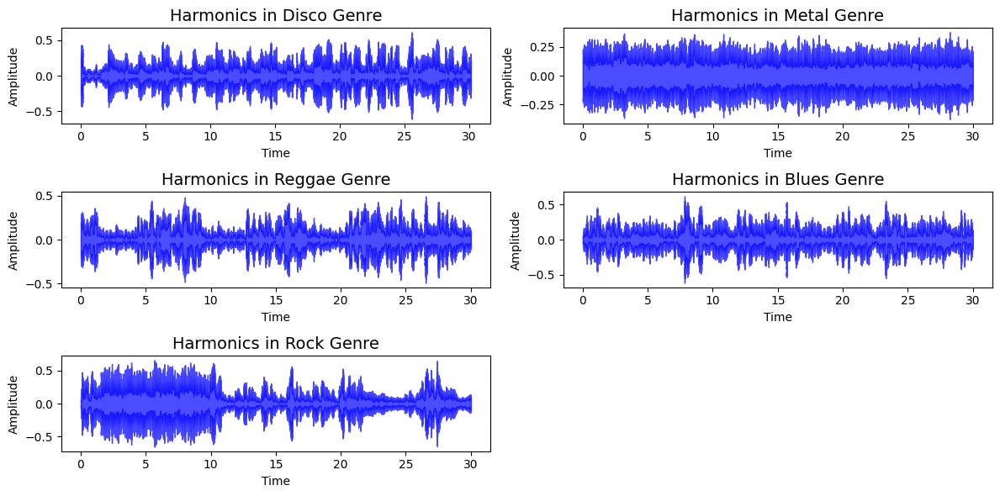

In [17]:
from librosa.effects import harmonic

plt.figure(figsize=(12, 6))
for i, genre in enumerate(genres[:5], 1):  # Visualize for 5 genres
    plt.subplot(3, 2, i)
    harmonic_part = harmonic(audio_data[genre])
    librosa.display.waveshow(harmonic_part, sr=sampling_rates[genre], alpha=0.7, color='blue')
    plt.title(f"Harmonics in {genre.capitalize()} Genre", fontsize=14)
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()


# Perceptual Features

Spectral Harmonic-to-Noise Ratio (HNR)

Librosa does not directly compute HNR, but it can be estimated indirectly by separating harmonic and percussive components and measuring their energy.

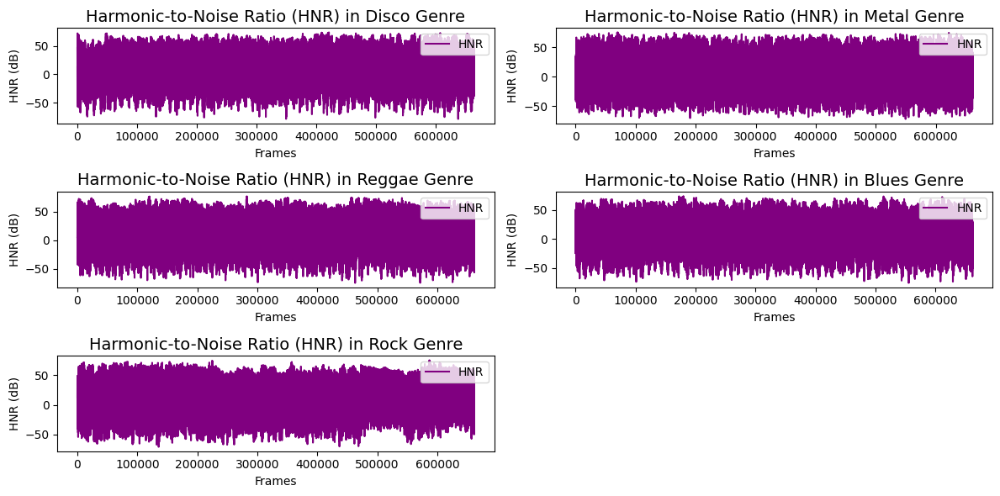

In [18]:
from librosa.effects import harmonic, percussive

plt.figure(figsize=(12, 6))
for i, genre in enumerate(genres[:5], 1):  # Visualize for 5 genres
    plt.subplot(3, 2, i)
    # Separate Harmonic and Percussive Components
    harmonic_part = harmonic(audio_data[genre])
    percussive_part = percussive(audio_data[genre])
    hnr = librosa.amplitude_to_db(np.abs(harmonic_part)) - librosa.amplitude_to_db(np.abs(percussive_part))

    # Plot HNR
    plt.plot(hnr, label='HNR', color='purple')
    plt.title(f"Harmonic-to-Noise Ratio (HNR) in {genre.capitalize()} Genre", fontsize=14)
    plt.xlabel("Frames")
    plt.ylabel("HNR (dB)")
    plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


# Applications of Harmonic and Perceptual Visualizations

Music Genre Classification:

Different genres exhibit different harmonic structures (e.g., classical music has strong harmonic content, while metal may have less harmonic purity).
Speech Analysis:

Harmonics are critical for analyzing vowels and distinguishing speech from noise.

Timbre Recognition:

Visualizing harmonics helps differentiate instruments (e.g., piano vs. guitar).

Audio Restoration:

HNR visualization is used to identify noise components for denoising.

# Harmonic-Percussive Source Separation (HPSS)

it is a technique to decompose an audio signal into two components:

Harmonic Component (y_harm): Contains the tonal or steady parts of the signal (e.g., sustained notes in music or a singer's voice).
Percussive Component (y_perc): Contains the transient or non-tonal parts of the signal (e.g., drum hits, claps, or sharp attacks).

The harmonic component (y_harm) is plotted in purple (#A300F9).
The percussive component (y_perc) is plotted in orange (#FFB100).

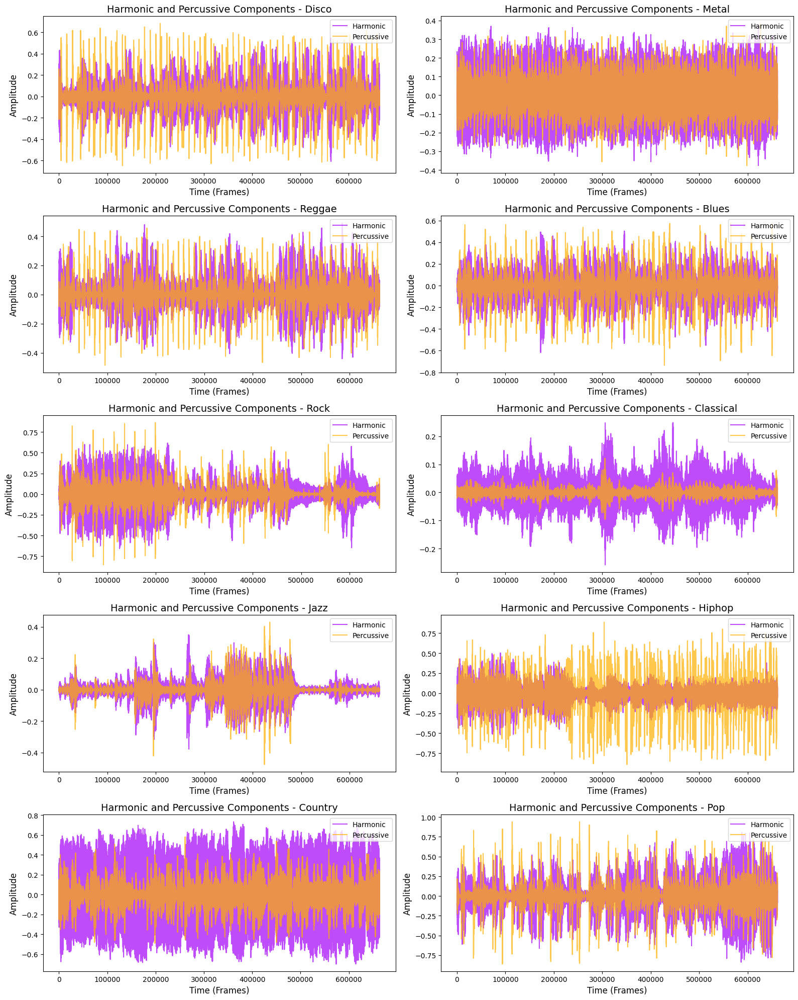

In [19]:
plt.figure(figsize=(16, 20))

for i, genre in enumerate(genres, 1):
    plt.subplot(5, 2, i)
    
    # Get the audio data and sampling rate from the pre-loaded dictionaries
    audio_data_genre = audio_data[genre]
    sr = sampling_rates[genre]
    
    # Perform Harmonic-Percussive Source Separation (HPSS)
    y_harm, y_perc = librosa.effects.hpss(audio_data_genre)
    
    # Plot the harmonic and percussive components
    plt.plot(y_harm, color='#A300F9', label='Harmonic', alpha=0.7)
    plt.plot(y_perc, color='#FFB100', label='Percussive', alpha=0.7)
    
    # Set plot labels and title
    plt.title(f"Harmonic and Percussive Components - {genre.capitalize()}", fontsize=14)
    plt.xlabel("Time (Frames)", fontsize=12)
    plt.ylabel("Amplitude", fontsize=12)
    plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


# Tempo Distribution

Tempo is a key rhythmic feature for distinguishing genres.
                               
Faster tempos often indicate electronic or dance music, while slower tempos suggest classical or blues.
                                                      
How to Use:
                                                      
Extract the tempo of songs and plot the distribution across genres (e.g., a boxplot or histogram).
                                                      
Key Observations:
                                                      
Dance genres may cluster around higher tempos (~120–140 BPM).
                                                      
Genres like blues or ballads may have lower tempos (~60–80 BPM).

Tempo (BPM) for Disco: 117.45
Tempo (BPM) for Metal: 95.70
Tempo (BPM) for Reggae: 123.05
Tempo (BPM) for Blues: 123.05
Tempo (BPM) for Rock: 123.05
Tempo (BPM) for Classical: 95.70
Tempo (BPM) for Jazz: 123.05
Tempo (BPM) for Hiphop: 117.45
Tempo (BPM) for Country: 86.13
Tempo (BPM) for Pop: 89.10


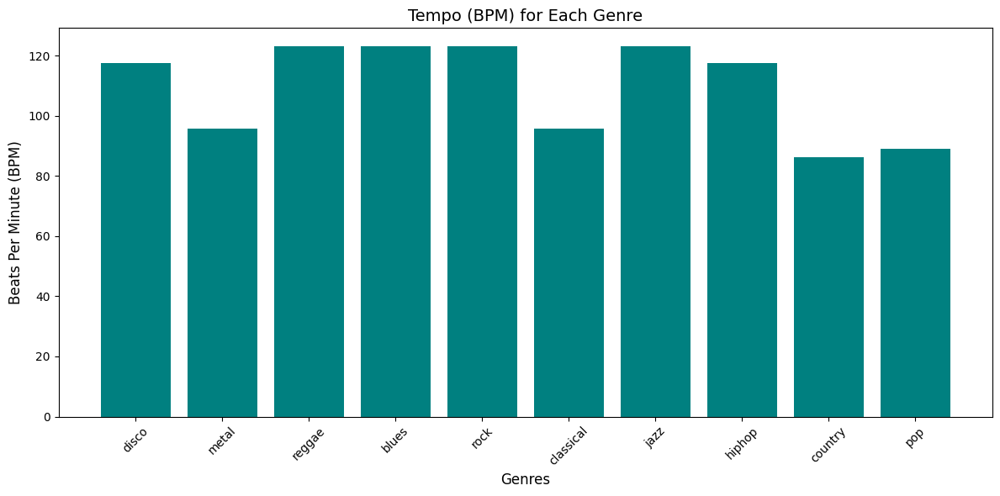

In [20]:
import librosa
import matplotlib.pyplot as plt

# Initialize an empty list to store BPM values
bpm_values = []

# Loop through all genres and extract BPM for each genre
for genre in genres:
    audio_data_genre = audio_data[genre]
    sr = sampling_rates[genre]
    
    # Estimate the tempo (BPM) and beat frames
    tempo, _ = librosa.beat.beat_track(y=audio_data_genre, sr=sr)
    
    # Ensure that BPM is extracted correctly as a scalar value (e.g., float)
    tempo_value = float(tempo)  # Convert to float just in case
    
    # Print the BPM for each genre
    print(f"Tempo (BPM) for {genre.capitalize()}: {tempo_value:.2f}")  # Print the BPM to two decimal places

    # Append the BPM value
    bpm_values.append(tempo_value)

# Now let's visualize the BPMs for all genres
plt.figure(figsize=(12, 6))
plt.bar(genres, bpm_values, color='teal')
plt.title('Tempo (BPM) for Each Genre', fontsize=14)
plt.xlabel('Genres', fontsize=12)
plt.ylabel('Beats Per Minute (BPM)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Class Distribution
Ensure that your dataset is balanced across genres, as imbalanced classes can lead to biased models.
    
How to Use:
Plot a bar chart showing the number of samples per genre.
    
Key Observations:
If some genres have fewer samples, consider data augmentation or weighted loss functions during training.

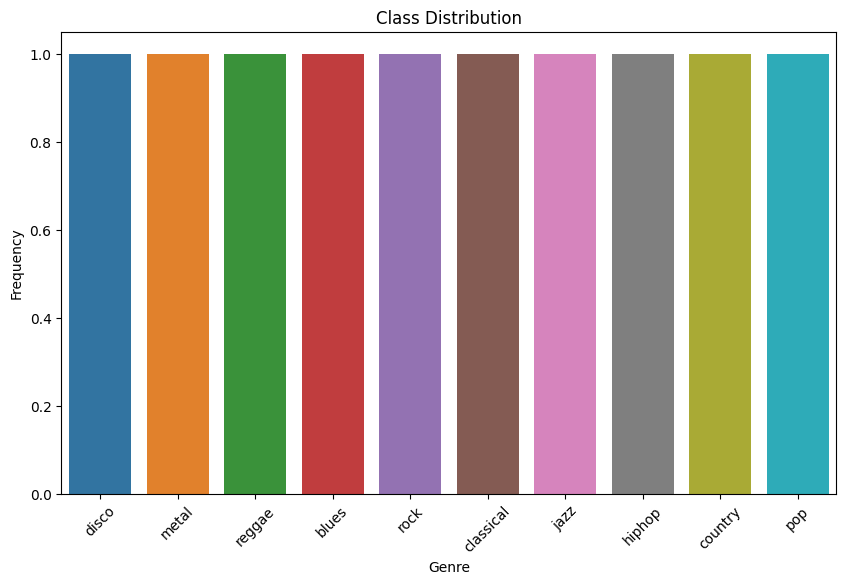

In [21]:
y_genre=['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']
# Assuming you have a list of genre labels (e.g., `y_genre`)
plt.figure(figsize=(10, 6))
sns.countplot(x=y_genre)
plt.title("Class Distribution")
plt.xlabel("Genre")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()

#Genre Clusters (t-SNE or PCA)
Use dimensionality reduction techniques like t-SNE or PCA to visualize how features group genres in lower-dimensional space.
How to Use:
Extract key features (MFCCs, tempo, etc.).
Apply t-SNE or PCA to reduce the feature space to 2D or 3D.
Visualize the clusters of songs based on genre.
Key Observations:
Overlapping clusters may indicate genre similarities (e.g., pop and rock).
Distinct clusters can confirm good feature representation.


# EDA

EDA is going to be performed on the features_30_sec.csv. This file contains the mean and variance for each audio file fo the features analysed above.

So, the table has a final of 1000 rows (10 genrex x 100 audio files) and 60 features (dimensionalities).

In [22]:
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [23]:
data.columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

# Correlation Heatmap for feature mean

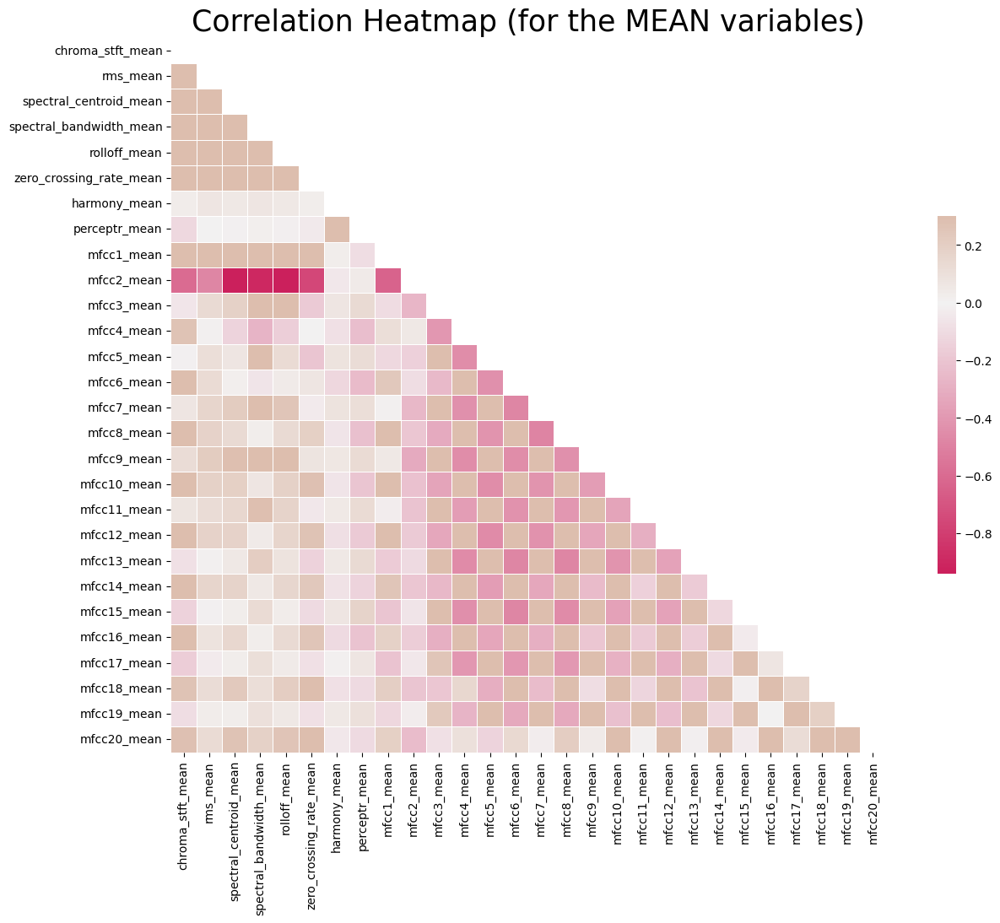

In [24]:
# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
plt.savefig("Corr Heatmap.jpg")

# Box Plot for Genres Distributions

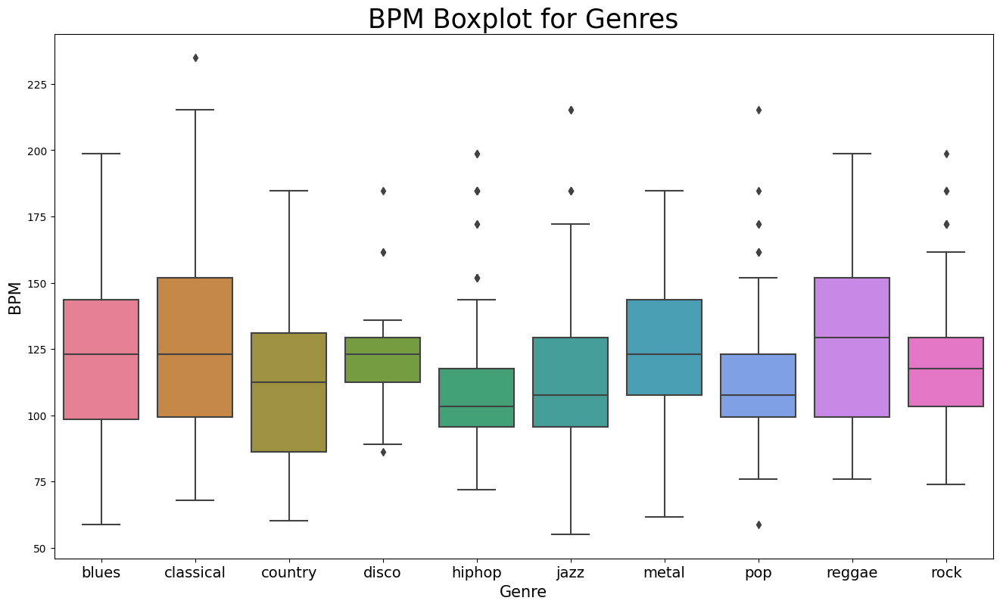

In [25]:
x = data[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

# Principal Component Analysis - 

abso visualize possible groups of genres

Normalization

PCA

The Scatter Plot

In [26]:
from sklearn import preprocessing

data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

#### NORMALIZE X ####
cols = X.columns


min_max_scaler = preprocessing.MinMaxScaler()


np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

In [27]:
X

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.113487,0.362279,0.695468,0.318188,0.101983,0.314117,0.040233,0.422879,0.109789,0.385532,...,0.564186,0.112704,0.541287,0.057615,0.422444,0.082450,0.487950,0.109503,0.599189,0.078255
1,0.113487,0.343622,0.793392,0.230894,0.085580,0.248405,0.121475,0.436889,0.296867,0.353329,...,0.570198,0.120353,0.574685,0.118286,0.448184,0.102997,0.548800,0.099081,0.579640,0.075947
2,0.113487,0.389832,0.640692,0.433652,0.099064,0.254261,0.049046,0.325334,0.095712,0.289224,...,0.622467,0.081898,0.331003,0.085962,0.370988,0.116420,0.453724,0.087317,0.501381,0.045405
3,0.113487,0.473508,0.777954,0.345856,0.229160,0.129376,0.058253,0.267404,0.227566,0.181068,...,0.565151,0.091876,0.484549,0.092509,0.460684,0.068975,0.538690,0.062612,0.468060,0.048168
4,0.113487,0.277759,0.681062,0.219641,0.083075,0.327270,0.110761,0.325514,0.113536,0.357017,...,0.383289,0.200462,0.410225,0.156424,0.403875,0.120300,0.424652,0.130173,0.233047,0.094836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.113487,0.366294,0.565355,0.188974,0.012317,0.372066,0.090548,0.462737,0.113776,0.442001,...,0.599764,0.093498,0.137363,0.070955,0.528217,0.067274,0.355114,0.108986,0.530772,0.084307
996,0.113487,0.461109,0.480368,0.181264,0.021099,0.371728,0.057513,0.448340,0.104735,0.428856,...,0.666628,0.064317,0.222386,0.064937,0.506174,0.052253,0.332575,0.067713,0.485401,0.047815
997,0.113487,0.529141,0.483246,0.194487,0.011492,0.390015,0.073870,0.394101,0.093465,0.413981,...,0.601418,0.063653,0.152848,0.057215,0.563199,0.064824,0.178146,0.076420,0.504920,0.043984
998,0.113487,0.387488,0.738721,0.200112,0.043603,0.214389,0.076729,0.352424,0.143718,0.285865,...,0.441895,0.096819,0.446369,0.075619,0.494291,0.059564,0.405462,0.088864,0.462871,0.066938


In [28]:
#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)

pca.explained_variance_ratio_

# 44.93 variance explained

array([0.2439355 , 0.21781804])

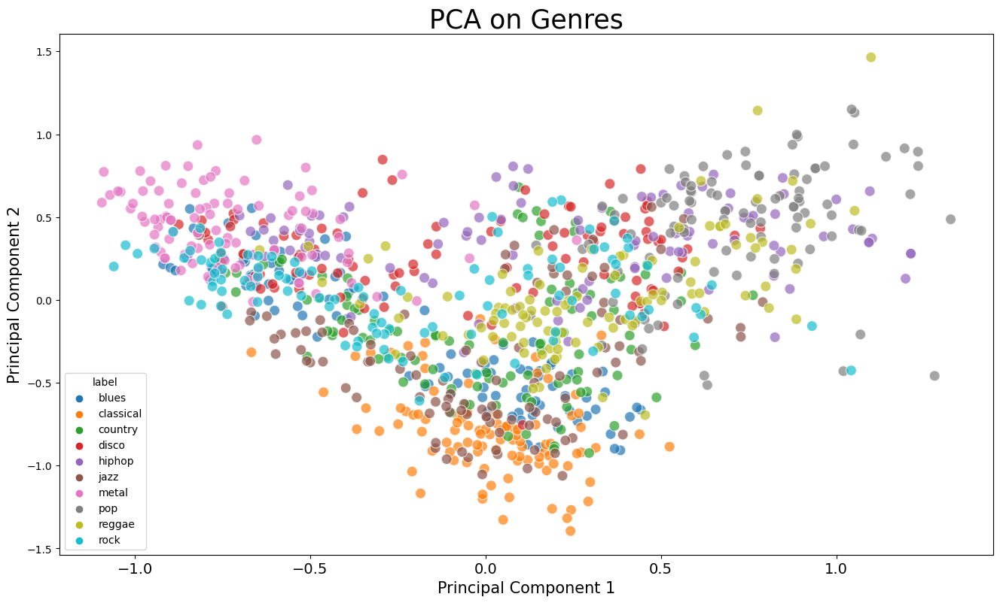

In [29]:
plt.figure(figsize = (16, 9))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")

# Machine Learning Classification

Using the features_3_sec.csv file, we can try to build a classifier that accurately predicts for any new audio file input it's genre.

In [30]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

In [31]:
data = pd.read_csv(f'{general_path}/features_3_sec.csv')
data = data.iloc[0:, 1:] 
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


Features and Target variable

creates the target and feature variables

normalizes the data

In [32]:
y = data['label'] # genre variable.
X = data.loc[:, data.columns != 'label'] #select all columns but not the labels

#### NORMALIZE X ####

# Normalize so everything is on the same scale. 

cols = X.columns


min_max_scaler = preprocessing.MinMaxScaler()


np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data. 
X = pd.DataFrame(np_scaled, columns = cols)

In [33]:
X

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,0.0,0.376757,0.617031,0.111106,0.002984,0.206932,0.034101,0.380041,0.068680,0.266983,...,0.494342,0.060299,0.302553,0.069546,0.285713,0.044089,0.371046,0.040116,0.536263,0.042502
9986,0.0,0.413243,0.637013,0.128944,0.002687,0.277274,0.058465,0.438552,0.079860,0.349793,...,0.438282,0.045545,0.249505,0.122777,0.305915,0.081395,0.263338,0.052963,0.516365,0.020232
9987,0.0,0.374196,0.697548,0.116503,0.021500,0.176099,0.138139,0.331163,0.111494,0.202062,...,0.391617,0.112660,0.408760,0.038190,0.442668,0.035995,0.496892,0.039921,0.505937,0.045380
9988,0.0,0.436537,0.657745,0.148266,0.009825,0.324968,0.042367,0.473422,0.017567,0.413964,...,0.469334,0.039551,0.362864,0.029532,0.471308,0.028749,0.506738,0.019101,0.519900,0.013740


#Splitting the data into training and testing
70% - 30% split

In [34]:
from sklearn.model_selection import train_test_split

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [36]:
def model_assess(model, title = "Default"):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    #print(confusion_matrix(y_test, preds))
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [37]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'y' is your target variable
label_encoder = LabelEncoder()

# Convert string labels to numeric labels
y_encoded = label_encoder.fit_transform(y)

# Now you can use y_encoded for model training
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)


In [38]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

# Random Forest

rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
model_assess(lg, "Logistic Regression")

# Neural Nets
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
model_assess(nn, "Neural Nets")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Naive Bayes : 0.51952 

Accuracy Stochastic Gradient Descent : 0.65532 

Accuracy KNN : 0.80581 

Accuracy Decission trees : 0.65165 

Accuracy Random Forest : 0.81415 

Accuracy Support Vector Machine : 0.75409 

Accuracy Logistic Regression : 0.6977 

Accuracy Neural Nets : 0.67768 

Accuracy Cross Gradient Booster : 0.9009 

Accuracy Cross Gradient Booster (Random Forest) : 0.74708 



Accuracy : 0.9009 



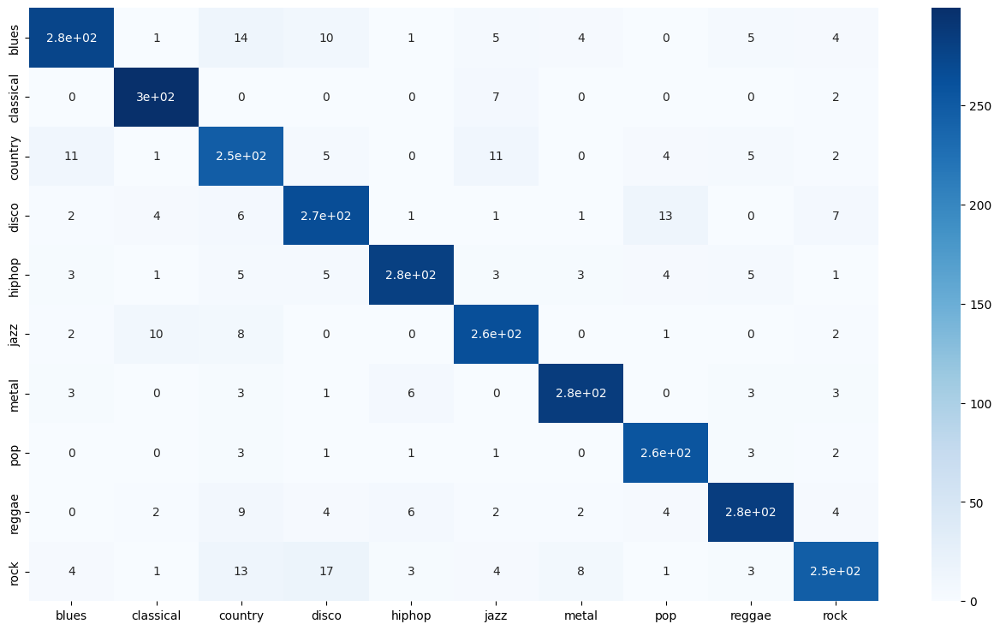

In [39]:
# Final model
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgb.fit(X_train, y_train)


preds = xgb.predict(X_test)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds) #normalize = 'true'
plt.figure(figsize = (16, 9))
sns.heatmap(confusion_matr, cmap="Blues", annot=True, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);
plt.savefig("conf matrix")

# Feature Importance

In [40]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(estimator=xgb, random_state=1)
perm.fit(X_test, y_test)

eli5.show_weights(estimator=perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1130 ± 0.0100,perceptr_var
0.0395 ± 0.0047,perceptr_mean
0.0352 ± 0.0069,mfcc4_mean
0.0332 ± 0.0053,chroma_stft_mean
0.0308 ± 0.0044,harmony_mean
0.0260 ± 0.0072,harmony_var
0.0203 ± 0.0026,mfcc6_mean
0.0201 ± 0.0040,mfcc9_mean
0.0189 ± 0.0036,rms_var
0.0172 ± 0.0065,mfcc11_mean


#Confusion Matrix

Visualize how well the model is classifying genres and where it’s making mistakes.
    
How to Use:
Generate a confusion matrix after model prediction.
Use a heatmap to visualize genre misclassifications.
    
Key Observations:
Understand which genres are often confused (e.g., classical and jazz may overlap).
Focus on misclassified genres to improve feature extraction or model architecture.

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming y_true and y_pred are the true and predicted labels
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=genres, yticklabels=genres)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

NameError: name 'y_true' is not defined

# Recommender Systems

"Recomender" Systems enable us for any given vector to find the best similarity, ranked in descending order, from the bast match to the least best match.

For Audio files, this will be done through cosine_similarity library.

In [ ]:
# Libraries
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

# Read data
data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')

# Extract labels
labels = data[['label']]

# Drop labels from original dataframe
data = data.drop(columns=['length','label'])
data.head()

# Scale the data
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

In [ ]:
# Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

In [ ]:
def find_similar_songs(name):
    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)
    
    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)
    
    # Display the 5 top matches 
    print("\n*******\nSimilar songs to ", name)
    print(series.head(5))

# e.g.

In [ ]:
# pop.00019 - Britney Spears "Hit me baby one more time"
find_similar_songs('pop.00019.wav') 

ipd.Audio(f'{general_path}/genres_original/pop/pop.00019.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00023.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00034.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00078.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00088.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00091.wav')

In [ ]:
# METAL Example

In [ ]:
# metal.00002 - Iron Maiden "Flight of Icarus"
find_similar_songs('metal.00002.wav') 

ipd.Audio(f'{general_path}/genres_original/metal/metal.00002.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/metal/metal.00028.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/metal/metal.00059.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/rock/rock.00018.wav')


In [ ]:
ipd.Audio(f'{general_path}/genres_original/rock/rock.00017.wav')

In [ ]:
ipd.Audio(f'{general_path}/genres_original/rock/rock.00016.wav')